In [1]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)
import os
import sys
import logging
import argparse
os.environ["DATASET"] = "../datasets"

pth = '/'.join(sys.path[0].split('/')[:-1])
sys.path.insert(0, pth)

from pprint import pprint
import numpy as np
np.random.seed(1)

home_dir = os.path.abspath(os.getcwd()+"/../")
sys.path.append(home_dir)
print(home_dir)

import warnings
warnings.filterwarnings(action='ignore')
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)
from torchvision import transforms
from PIL import Image

from hdecoder.BaseModel import BaseModel
from hdecoder import build_model
from utils.distributed import init_distributed
from utils.arguments import load_opt_from_config_files, load_config_dict_to_opt
from datasets.utils.vcoco_utils import get_random_images, walk_through_dir
from utils.visualizer import draw_hoi_results, draw_obj_attentions, draw_hoi_attention

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Tue_May__3_18:49:52_PDT_2022
Cuda compilation tools, release 11.7, V11.7.64
Build cuda_11.7.r11.7/compiler.31294372_0


/home/djjin/anaconda3/envs/conda_X_decoder/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


torch:  1.13 ; cuda:  cu117
detectron2: 0.6
/home/djjin/Mygit/HOI


Invalid MIT-MAGIC-COOKIE-1 key

### Define model path and load config

In [2]:
from utils.arguments import load_vcoco_opt_command, load_vcoco_parser

cmdline_args = load_vcoco_parser()
cmdline_args.conf_files = [os.path.join(home_dir, "configs/hdecoder/vcoco_large.yaml")]
model_path = '../checkpoints/vcoco_hdecoder_l.pt'

cmdline_args.overrides = ['WEIGHT', 'true', 'RESUME_FROM', model_path] 

opt = load_vcoco_opt_command(cmdline_args)
opt = init_distributed(opt)
pretrained_pth = os.path.join(opt['RESUME_FROM'])

In [3]:
model = BaseModel(opt, build_model(opt)).from_pretrained(pretrained_pth).eval().cuda()

INFO:utils.model:Loaded backbone.layers.0.blocks.0.gamma_1, Model Shape: torch.Size([192]) <-> Ckpt Shape: torch.Size([192])
INFO:utils.model:Loaded backbone.layers.0.blocks.0.gamma_2, Model Shape: torch.Size([192]) <-> Ckpt Shape: torch.Size([192])
INFO:utils.model:Loaded backbone.layers.0.blocks.0.mlp.fc1.bias, Model Shape: torch.Size([768]) <-> Ckpt Shape: torch.Size([768])
INFO:utils.model:Loaded backbone.layers.0.blocks.0.mlp.fc1.weight, Model Shape: torch.Size([768, 192]) <-> Ckpt Shape: torch.Size([768, 192])
INFO:utils.model:Loaded backbone.layers.0.blocks.0.mlp.fc2.bias, Model Shape: torch.Size([192]) <-> Ckpt Shape: torch.Size([192])
INFO:utils.model:Loaded backbone.layers.0.blocks.0.mlp.fc2.weight, Model Shape: torch.Size([192, 768]) <-> Ckpt Shape: torch.Size([192, 768])
INFO:utils.model:Loaded backbone.layers.0.blocks.0.modulation.f.bias, Model Shape: torch.Size([389]) <-> Ckpt Shape: torch.Size([389])
INFO:utils.model:Loaded backbone.layers.0.blocks.0.modulation.f.weight,

### Define image transform

In [4]:
t = []
t.append(transforms.Resize(800, interpolation=Image.BICUBIC))
transform = transforms.Compose(t)

### Define image paths

In [5]:
image_path = home_dir + '/images'
image_paths = os.listdir(image_path)
image_paths = sorted([os.path.join(image_path, file) for file in image_paths if file.endswith(".jpg")])
image_paths

['/home/djjin/Mygit/HOI/images/val_1.jpg',
 '/home/djjin/Mygit/HOI/images/val_2.jpg',
 '/home/djjin/Mygit/HOI/images/val_3.jpg',
 '/home/djjin/Mygit/HOI/images/val_4.jpg',
 '/home/djjin/Mygit/HOI/images/val_5.jpg']

### Visualize HOI results

Detect 6 HOI!!
<person, stand> (69%)
<person, stand> (66%)
<person, stand> (21%)
<person, stand> (48%)
<person, stand> (44%)
<person, stand> (56%)


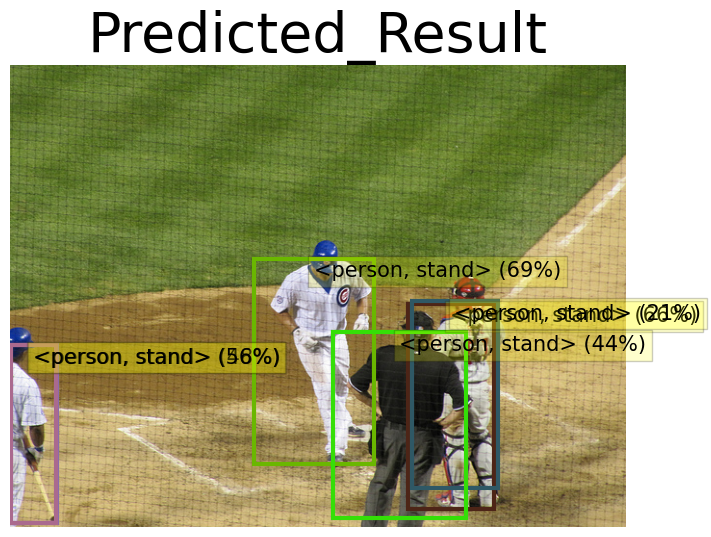

Detect 6 HOI!!
<person, look_obj, person> (50%)
<person, skateboard_instr, skateboard> (91%)
<person, stand> (95%)
<person, look_obj, person> (35%)
<person, stand> (91%)
<person, skateboard_instr, skateboard> (91%)


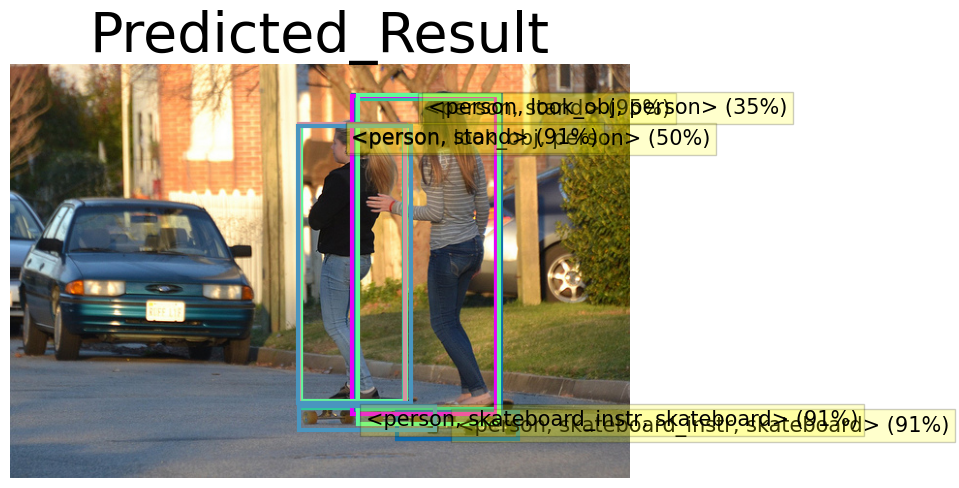

Detect 2 HOI!!
<person, cut_obj, pizza> (33%)
<person, hold_obj, knife> (74%)


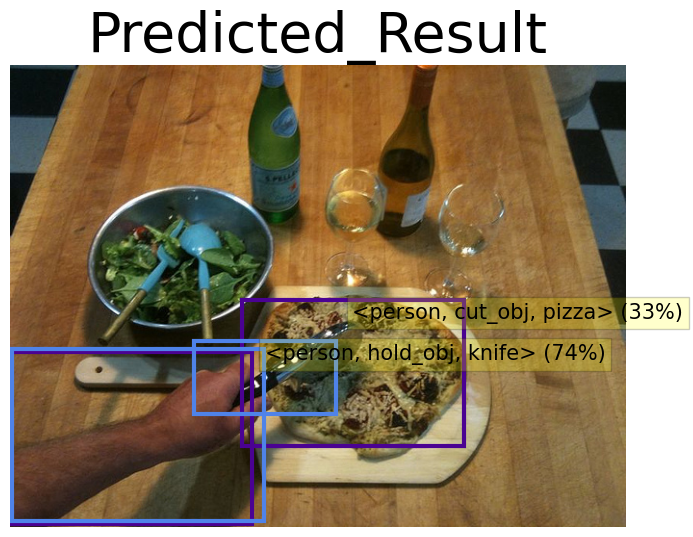

Detect 4 HOI!!
<person, stand> (40%)
<person, stand> (24%)
<person, surf_instr, surfboard> (92%)
<person, stand> (43%)


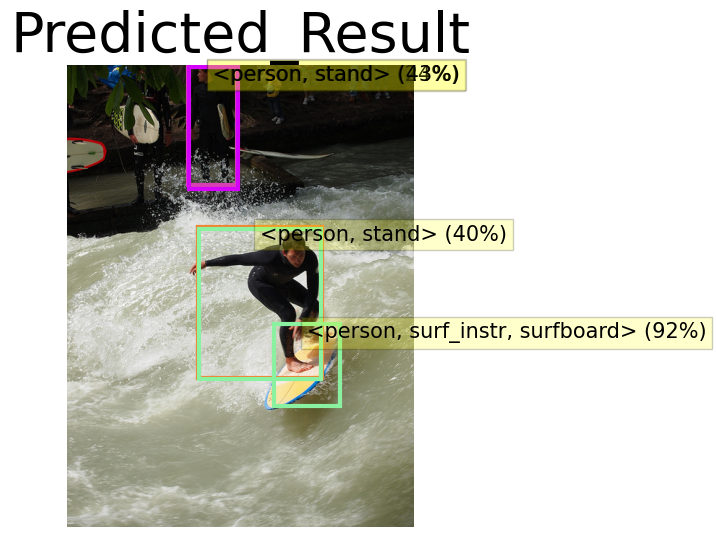

Detect 4 HOI!!
<person, sit_instr, horse> (88%)
<person, smile> (73%)
<person, smile> (84%)
<person, sit_instr, horse> (85%)


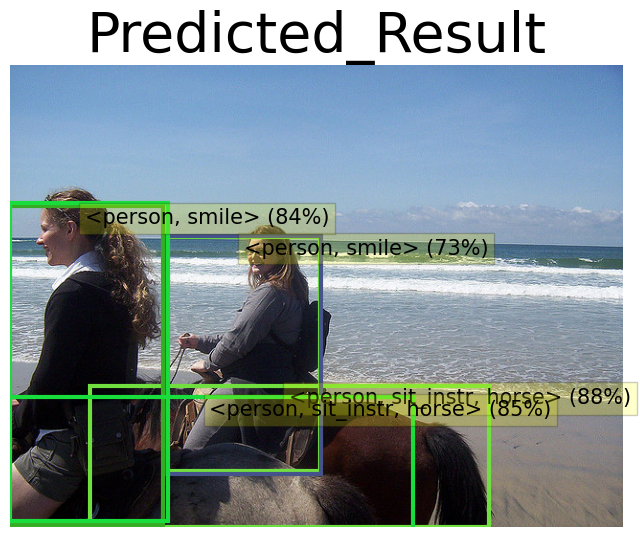

In [6]:
results = []
org_images = []
for image_pth in image_paths:
    image_ori = Image.open(image_pth).convert('RGB')
    
    width = image_ori.size[0]
    height = image_ori.size[1]
    orig_size = (height, width)
    result = model.model.hoi_inference(image_ori, orig_size, transform, thr=0.2)
    results.append(result[-1])
    org_images.append(image_ori)

draw_hoi_results(org_images, results, is_save=False)

### Visualize decoder attention map

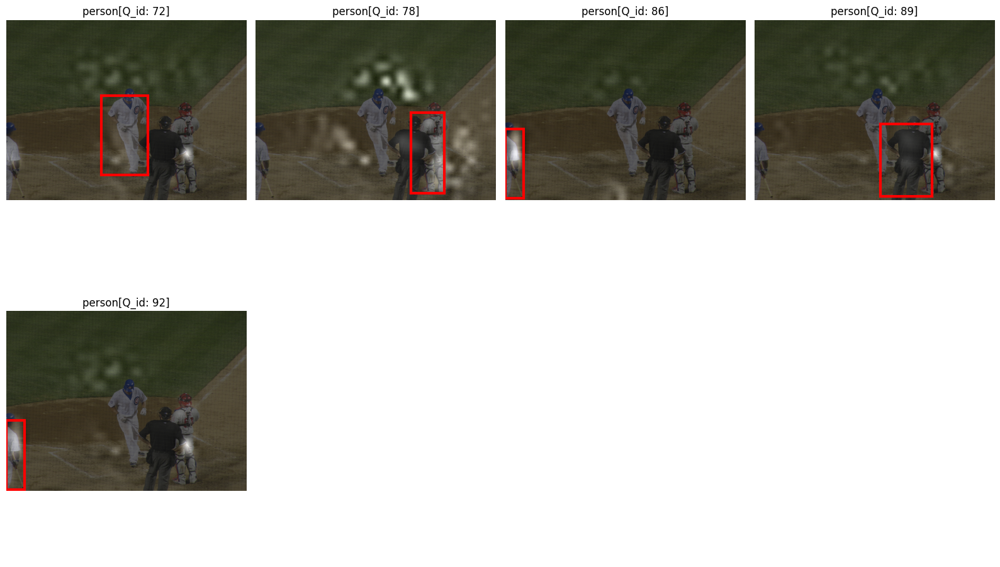

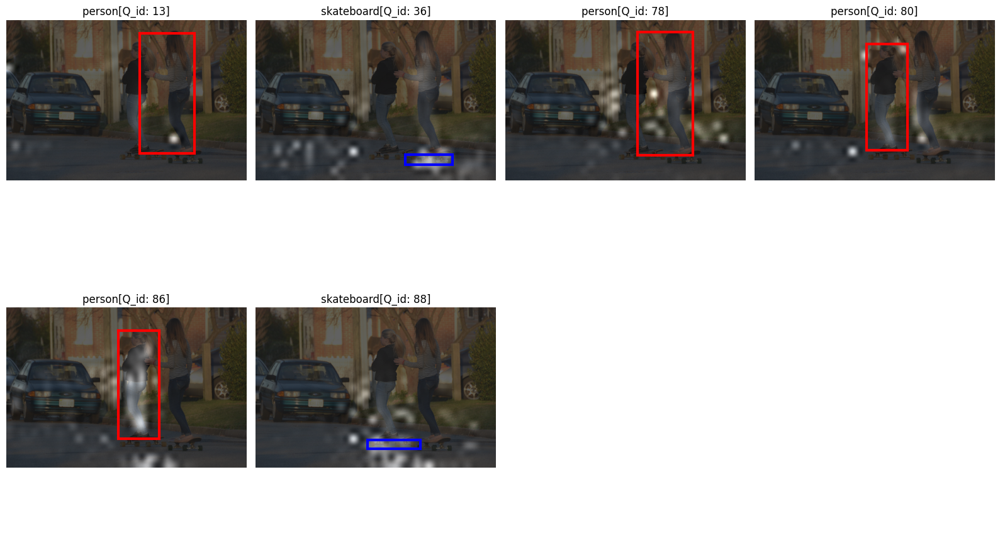

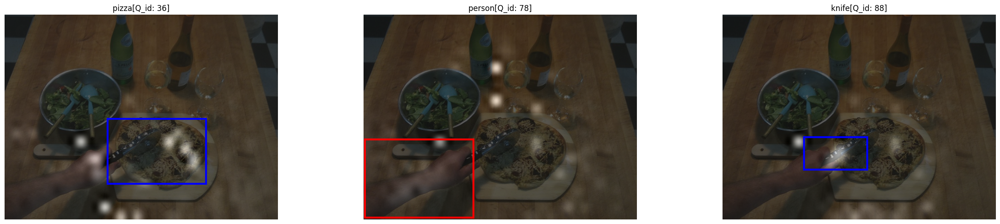

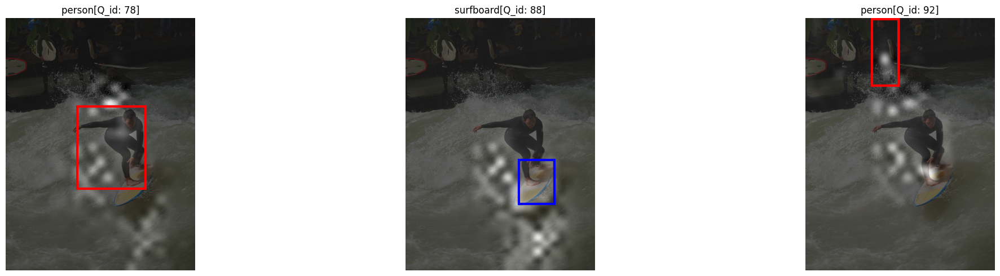

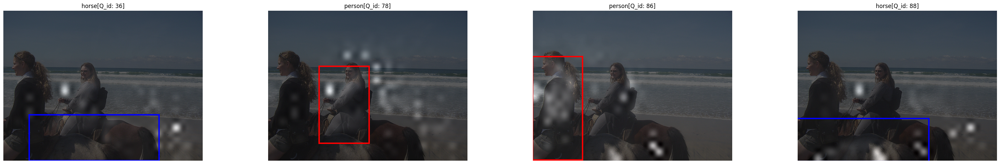

In [7]:
encoder_self_attn = model.model.hoid_head.encoder.transformer.encoder.layers[-1].self_attn
decoder_multihead_attn = model.model.hoid_head.hoi_decoder.hopd_decoder.layers[-1].multihead_attn

results = []
org_images = []
for image_pth in image_paths:
    image_ori = Image.open(image_pth).convert('RGB')
    
    width = image_ori.size[0]
    height = image_ori.size[1]
    orig_size = (height, width)
    conv_features, enc_attn_weights, dec_attn_weights = [], [], []
    
    hooks = [
        model.model.backbone.register_forward_hook(
            lambda self, input, output: conv_features.append(output)
        ),
        encoder_self_attn.register_forward_hook(
            lambda self, input, output: enc_attn_weights.append(output[1])
        ),
        decoder_multihead_attn.register_forward_hook(
            lambda self, input, output: dec_attn_weights.append(output[1])
        ),
    ]

    result = model.model.hoi_inference(image_ori, orig_size, transform, thr=0.5, return_only_outputs=True)
    
    for hook in hooks:
        hook.remove()

    conv_features = conv_features[0]
    enc_attn_weights = enc_attn_weights[0]
    dec_attn_weights = dec_attn_weights[0]

    tensor_orig_size = torch.tensor([width, height, width, height], dtype=torch.float32).to(opt["device"])
    # print(result.keys())
    draw_obj_attentions(result, image_ori, tensor_orig_size, conv_features, dec_attn_weights, thr=0.7, cmap='gist_gray')

### Visualize HOI results and attention map

Detect 3 HOI!!
<person, stand> (69%)
<person, stand> (66%)
<person, stand> (56%)


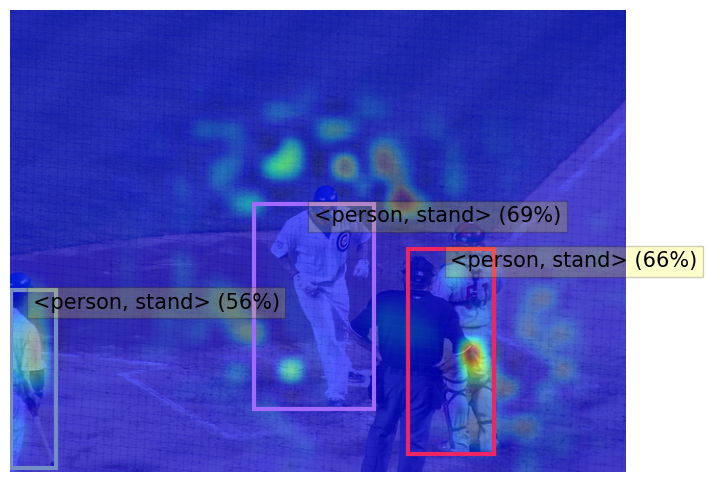

Detect 5 HOI!!
<person, look_obj, person> (50%)
<person, skateboard_instr, skateboard> (91%)
<person, stand> (95%)
<person, stand> (91%)
<person, skateboard_instr, skateboard> (91%)


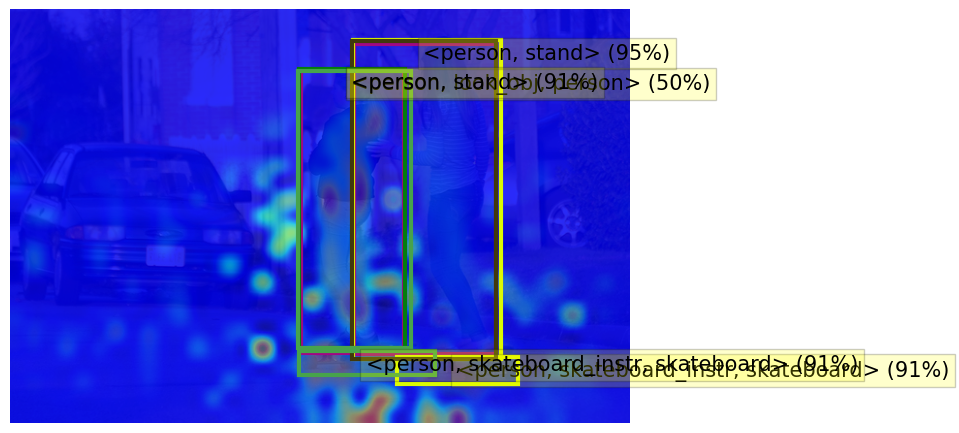

Detect 1 HOI!!
<person, hold_obj, knife> (74%)


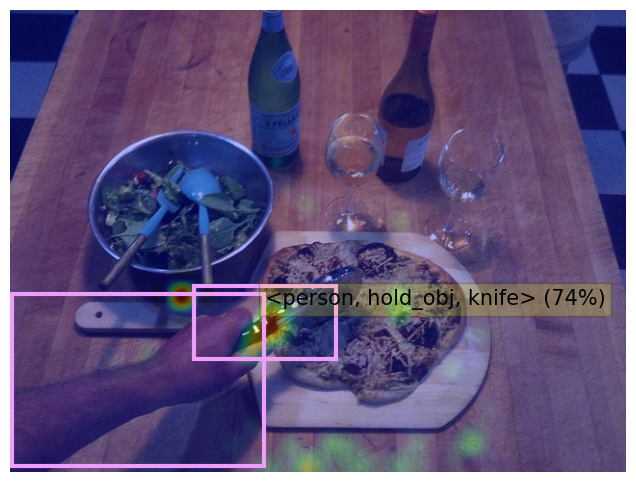

Detect 1 HOI!!
<person, surf_instr, surfboard> (92%)


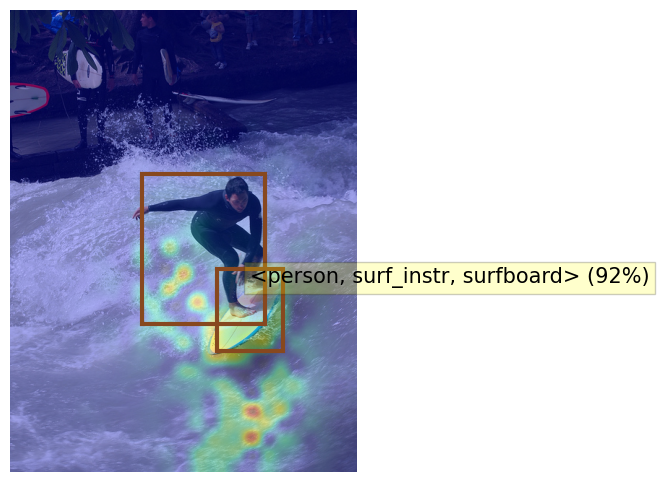

Detect 4 HOI!!
<person, sit_instr, horse> (88%)
<person, smile> (73%)
<person, smile> (84%)
<person, sit_instr, horse> (85%)


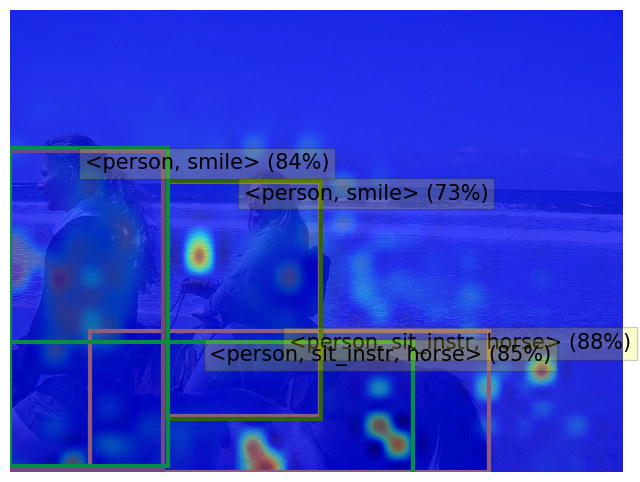

In [8]:

results = []
org_images = []
for image_pth in image_paths:
    image_ori = Image.open(image_pth).convert('RGB')
    
    width = image_ori.size[0]
    height = image_ori.size[1]
    orig_size = (height, width)
    
    conv_features, enc_attn_weights, dec_attn_weights = [], [], []
    
    hooks = [
        model.model.backbone.register_forward_hook(
            lambda self, input, output: conv_features.append(output)
        ),
        encoder_self_attn.register_forward_hook(
            lambda self, input, output: enc_attn_weights.append(output[1])
        ),
        decoder_multihead_attn.register_forward_hook(
            lambda self, input, output: dec_attn_weights.append(output[1])
        ),
    ]

    result = model.model.hoi_inference(image_ori, orig_size, transform, thr=0.5)
    
    for hook in hooks:
        hook.remove()


    conv_features = conv_features[0]
    enc_attn_weights = enc_attn_weights[0]
    dec_attn_weights = dec_attn_weights[0]
    draw_hoi_attention(result, image_ori, conv_features, dec_attn_weights, cmap='jet', alpha=0.3)